In [1]:
!git clone https://github.com/ultralytics/yolov5.git

fatal: destination path 'yolov5' already exists and is not an empty directory.


In [2]:
from google.colab import drive
drive.mount('/content/gdrive')
path = "gdrive/My Drive/Master Computer Science/Programming for Advanced AI"

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [3]:
cd yolov5

/content/yolov5


In [4]:
!pip install -r requirements.txt

In [5]:
# /content/gdrive/MyDrive/Master Computer Science/Programming For Advanced AI/VisDrone.yaml

In [6]:
# !python train.py --img 640 --batch 16 --epochs 30 --data /content/gdrive/MyDrive/Master\ Computer\ Science/Programming\ For\ Advanced\ AI/VisDrone.yaml --weights yolov5s.pt --cache

2024-06-14 12:35:13.838182: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-06-14 12:35:13.838234: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-06-14 12:35:13.840193: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5s.pt, cfg=, data=/content/gdrive/MyDrive/Master Computer Science/Programming For Advanced AI/VisDrone.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=30, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyps, resume_evolve=None, bucket=, cach

In [7]:
best_checkpoint_path = "/content/gdrive/MyDrive/Master Computer Science/Programming for Advanced AI/best.pt"

In [8]:
import numpy as np
import pandas as pd
import cv2
from matplotlib import pyplot as plt
import random
import os
import torch

from PIL import Image
import matplotlib.pyplot as plt
import cv2

In [9]:
# from google.colab import drive
# drive.mount('/content/gdrive', force_remount=True)
# path = "gdrive/My Drive/Master Computer Science/Programming for Advanced AI"

In [10]:
# # Define the path to the zip file and the target directory
# zip_path = "/content/gdrive/MyDrive/Master Computer Science/Programming For Advanced AI/Dataset/VisDrone2019-DET-test-dev.zip"
# target_dir = "/content/gdrive/MyDrive/Master Computer Science/Programming For Advanced AI/Dataset/VisDrone2019-DET-test-dev/"

# # Unzip the file
# !unzip -q "{zip_path}" -d "{target_dir}"


In [11]:
print(os.path.isdir("/content/gdrive/MyDrive/Master Computer Science/Programming for Advanced AI/Dataset/VisDrone2019-test-dev/images/"))
print(os.path.isdir("/content/gdrive/MyDrive/Master Computer Science/Programming for Advanced AI/Dataset/VisDrone2019-test-dev/annotations/"))

True
True


Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-6-14 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7037095 parameters, 0 gradients, 15.8 GFLOPs
Adding AutoShape... 
WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/1: 765x1360 16 pedestrians, 1 people, 41 cars, 1 van, 1 truck, 7 motors
Speed: 430.4ms pre-process, 204.1ms inference, 1397.4ms NMS per image at shape (1, 3, 384, 640)


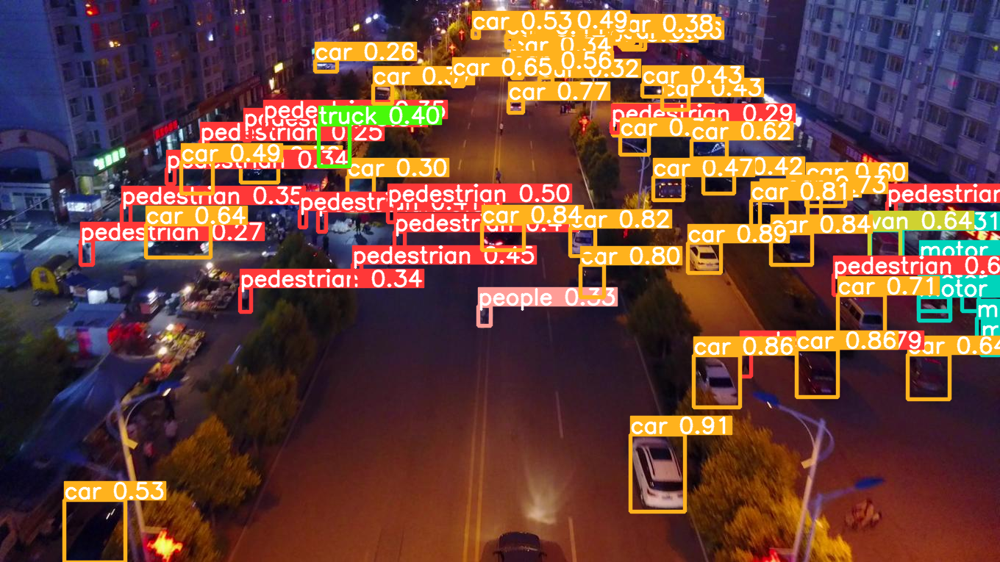

image 1/1: 788x1400 1 pedestrian, 13 cars, 2 vans, 1 truck
Speed: 731.7ms pre-process, 10.3ms inference, 3.1ms NMS per image at shape (1, 3, 384, 640)


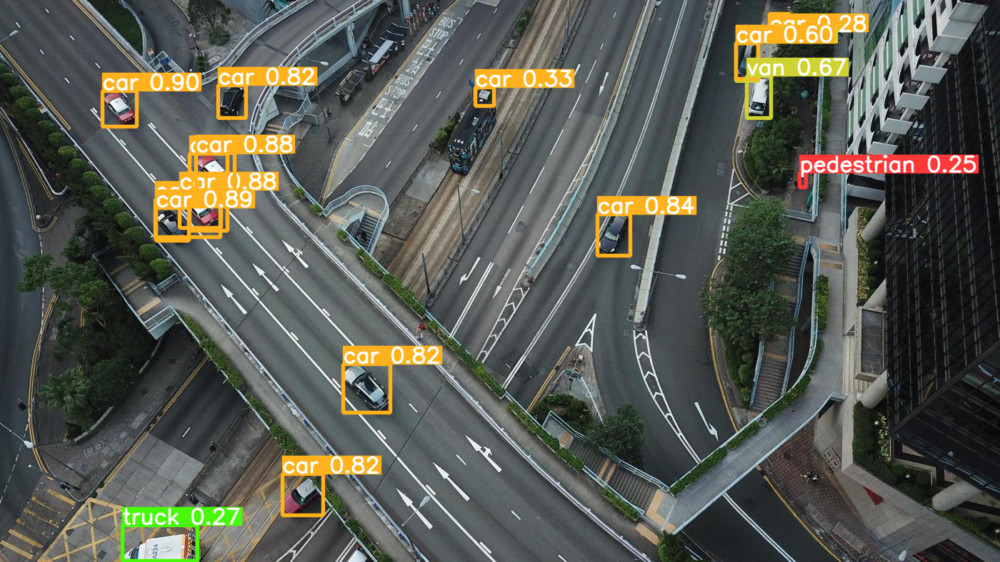

image 1/1: 788x1400 3 cars
Speed: 716.5ms pre-process, 16.9ms inference, 2.5ms NMS per image at shape (1, 3, 384, 640)


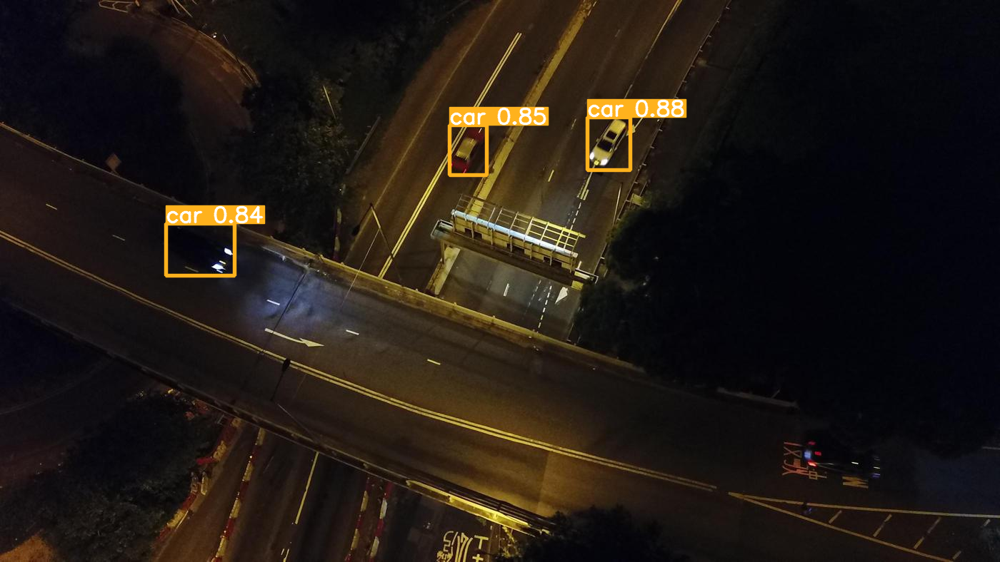

image 1/1: 788x1400 50 cars, 10 vans, 3 trucks, 1 bus
Speed: 564.5ms pre-process, 7.8ms inference, 1.7ms NMS per image at shape (1, 3, 384, 640)


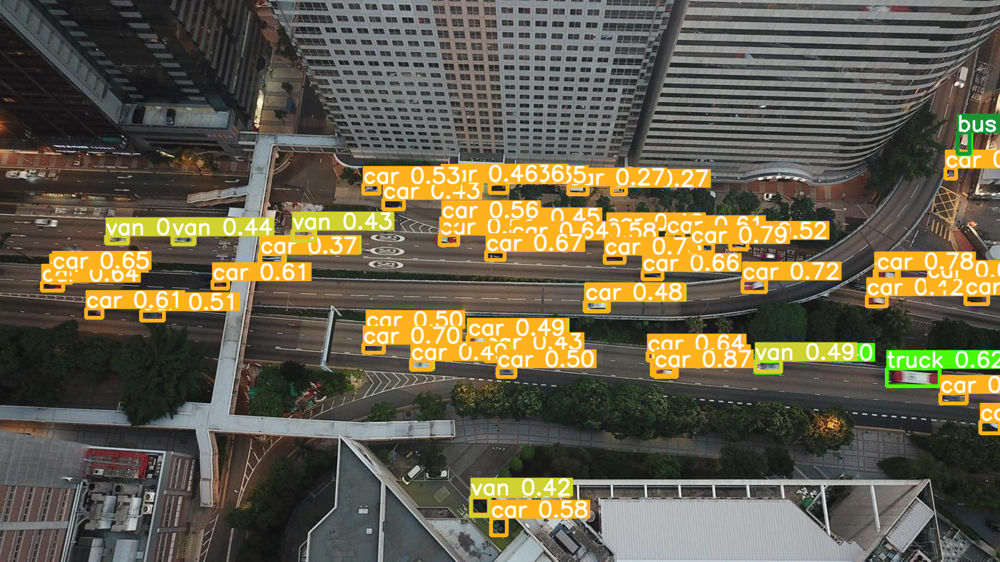

image 1/1: 788x1400 20 cars
Speed: 579.6ms pre-process, 20.9ms inference, 1.9ms NMS per image at shape (1, 3, 384, 640)


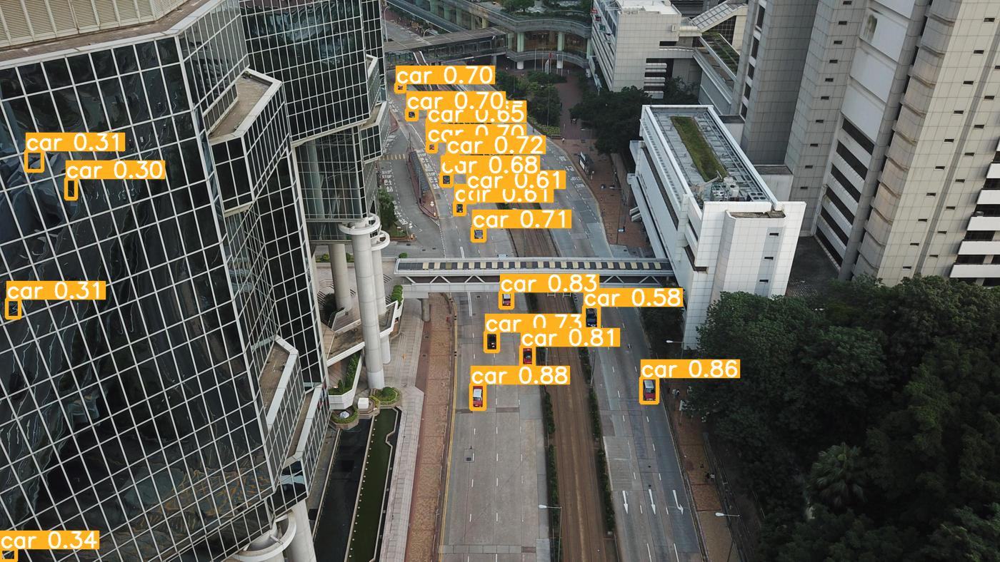

In [12]:
import torch
import os
import random
import matplotlib.pyplot as plt
import cv2

# Define paths
model_checkpoint = "/content/gdrive/MyDrive/Master Computer Science/Programming for Advanced AI/best.pt"
images_dir = "/content/gdrive/MyDrive/Master Computer Science/Programming for Advanced AI/Dataset/VisDrone2019-test-dev/images"

# Load model
model = torch.hub.load('ultralytics/yolov5', 'custom', path=model_checkpoint)

# Get list of images in the directory
image_files = [os.path.join(images_dir, img) for img in os.listdir(images_dir) if img.endswith(('.jpg', '.jpeg', '.png'))]

# Select 5 random images
random_images = random.sample(image_files, 5)

# Perform inference on each image
for image_path in random_images:
    # Perform inference
    results = model(image_path)

    # Print results
    results.print()

    # Show results
    results.show()

In [13]:
len(image_files)

1610

In [14]:
# Dictionary to map class IDs to class names
class_names_dict = {
    0: 'pedestrian',
    1: 'people',
    2: 'bicycle',
    3: 'car',
    4: 'van',
    5: 'truck',
    6: 'tricycle',
    7: 'awning-tricycle',
    8: 'bus',
    9: 'motor'
}

In [15]:
image_files

['/content/gdrive/MyDrive/Master Computer Science/Programming for Advanced AI/Dataset/VisDrone2019-test-dev/images/9999938_00000_d_0000200.jpg',
 '/content/gdrive/MyDrive/Master Computer Science/Programming for Advanced AI/Dataset/VisDrone2019-test-dev/images/9999952_00000_d_0000095.jpg',
 '/content/gdrive/MyDrive/Master Computer Science/Programming for Advanced AI/Dataset/VisDrone2019-test-dev/images/9999938_00000_d_0000431.jpg',
 '/content/gdrive/MyDrive/Master Computer Science/Programming for Advanced AI/Dataset/VisDrone2019-test-dev/images/9999938_00000_d_0000194.jpg',
 '/content/gdrive/MyDrive/Master Computer Science/Programming for Advanced AI/Dataset/VisDrone2019-test-dev/images/0000265_04500_d_0000010.jpg',
 '/content/gdrive/MyDrive/Master Computer Science/Programming for Advanced AI/Dataset/VisDrone2019-test-dev/images/9999952_00000_d_0000169.jpg',
 '/content/gdrive/MyDrive/Master Computer Science/Programming for Advanced AI/Dataset/VisDrone2019-test-dev/images/9999973_00000_d

In [16]:
len(image_files)

1610

In [17]:
# Load model
model = torch.hub.load('ultralytics/yolov5', 'custom', path=model_checkpoint)
model.eval()

Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-6-14 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7037095 parameters, 0 gradients, 15.8 GFLOPs
Adding AutoShape... 


AutoShape(
  (model): DetectMultiBackend(
    (model): DetectionModel(
      (model): Sequential(
        (0): Conv(
          (conv): Conv2d(3, 32, kernel_size=(6, 6), stride=(2, 2), padding=(2, 2))
          (act): SiLU(inplace=True)
        )
        (1): Conv(
          (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
          (act): SiLU(inplace=True)
        )
        (2): C3(
          (cv1): Conv(
            (conv): Conv2d(64, 32, kernel_size=(1, 1), stride=(1, 1))
            (act): SiLU(inplace=True)
          )
          (cv2): Conv(
            (conv): Conv2d(64, 32, kernel_size=(1, 1), stride=(1, 1))
            (act): SiLU(inplace=True)
          )
          (cv3): Conv(
            (conv): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1))
            (act): SiLU(inplace=True)
          )
          (m): Sequential(
            (0): Bottleneck(
              (cv1): Conv(
                (conv): Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1))
  

In [18]:
def create_df_mAP(image_files, model, class_names_dict):
    boxes_gt = []
    class_gt = []
    img_id_gt = []

    boxes_pred = []
    class_pred = []
    img_id_pred = []
    scores_pred = []

    for i in range(len(image_files)):
        img_id = 'img_' + str(i)
        # prediction
        image_path = image_files[i]
        img_cv2 = cv2.imread(image_path)
        img_rgb = cv2.cvtColor(img_cv2, cv2.COLOR_BGR2RGB)
        # Convert numpy array to PIL Image
        image = Image.fromarray(img_rgb)
        # Use YOLOv5 model to detect objects in the image
        results_i = model(image)

        predictions_i = results_i.pred[0].cpu()  # predictions for the first image
        boxes_i = predictions_i[:, :4].numpy() # xyxy (xmin, ymin, xmax, ymax)
        scores_i = predictions_i[:, 4].numpy() # confidence scores
        class_ids_i = predictions_i[:, 5].int().numpy()  # class IDs

        if(len(boxes_i) != 0):
            for j in range(len(boxes_i)):
                boxes_pred.append(np.asarray(boxes_i[j],dtype="int"))
                class_pred.append(class_names_dict.get(class_ids_i[j]))
                scores_pred.append(scores_i[j])
                img_id_pred.append(img_id)

        # ground truth
        annotation_path = image_path.replace('/images/', '/annotations/')
        annotation_path = annotation_path.replace('.jpg', '.txt')
        with open(annotation_path, 'r') as file:
            lines = file.readlines()
            for line in lines:
                elements = line.strip().split(',')
                x_min, y_min, width, height, class_label = int(elements[0]), int(elements[1]), int(elements[2]), int(elements[3]), int(elements[5]) - 1
                if (0 <= class_label <= 9 and width  > 0 and height > 0):
                    boxes_gt.append([x_min, y_min, x_min + width, y_min + height])
                    class_gt.append(class_names_dict.get(class_label))
                    img_id_gt.append(img_id)

    pred_df = pd.DataFrame({'box_pred': boxes_pred, 'confidence': scores_pred, 'class': class_pred, 'img_id': img_id_pred})
    gt_df = pd.DataFrame({'box_gt': boxes_gt, 'class': class_gt, 'img_id': img_id_gt})
    return gt_df,pred_df

In [19]:
gt_df, pred_df = create_df_mAP(image_files, model, class_names_dict)

In [20]:
def convert_bbox_format(bbox):
    x_min, y_min, x_max, y_max = bbox
    return [(x_min, y_min), (x_max, y_max)]

In [21]:
gt_df['box_gt'] = gt_df['box_gt'].apply(convert_bbox_format)

In [22]:
gt_df

,box_gt,class,img_id
0,"[(398, 236), (406, 248)]",pedestrian,img_0
1,"[(387, 245), (394, 254)]",pedestrian,img_0
2,"[(391, 254), (397, 265)]",pedestrian,img_0
3,"[(376, 248), (381, 259)]",pedestrian,img_0
4,"[(344, 253), (350, 262)]",pedestrian,img_0
...,...,...,...
75097,"[(751, 667), (764, 682)]",pedestrian,img_1609
75098,"[(732, 670), (751, 688)]",pedestrian,img_1609
75099,"[(743, 698), (754, 717)]",pedestrian,img_1609
75100,"[(738, 716), (750, 728)]",pedestrian,img_1609


In [23]:
# Apply the function to the 'box_gt' column
pred_df['box_pred'] = pred_df['box_pred'].apply(convert_bbox_format)

In [24]:
pred_df

,box_pred,confidence,class,img_id
0,"[(657, 293), (676, 328)]",0.878271,car,img_0
1,"[(608, 589), (653, 739)]",0.876531,bus,img_0
2,"[(702, 267), (724, 304)]",0.874918,car,img_0
3,"[(665, 191), (682, 223)]",0.874755,car,img_0
4,"[(710, 127), (726, 154)]",0.860631,car,img_0
...,...,...,...,...
48728,"[(208, 676), (222, 698)]",0.276416,pedestrian,img_1609
48729,"[(439, 421), (453, 433)]",0.275280,pedestrian,img_1609
48730,"[(214, 643), (228, 663)]",0.270547,pedestrian,img_1609
48731,"[(251, 427), (266, 440)]",0.260350,pedestrian,img_1609


In [25]:
from shapely.geometry import Polygon
from shapely.geometry import Polygon, mapping

In [26]:
def calculate_IoU(box_A, box_B):
    top_left_A = box_A[0]
    bottom_right_A = box_A[1]
    top_right_A = (bottom_right_A[0], top_left_A[1])
    bottom_left_A = (top_left_A[0], bottom_right_A[1])

    top_left_B = box_B[0]
    bottom_right_B = box_B[1]
    top_right_B = (bottom_right_B[0], top_left_B[1])
    bottom_left_B = (top_left_B[0], bottom_right_B[1])

    A = Polygon([top_left_A, top_right_A, bottom_right_A, bottom_left_A]).buffer(0)
    B = Polygon([top_left_B, top_right_B, bottom_right_B, bottom_left_B])

    if(A.intersection(B)):
        intersection = A.intersection(B).area
        union = A.union(B).area
        iou = intersection/union
        return iou
    else:
        return 0

In [27]:
def IoU_per_class(sub_gt_df, sub_pred_df_sorted, class_name):
    IoU = []
    for i in range(sub_pred_df_sorted.shape[0]):
        box_pred_i = sub_pred_df_sorted.iloc[i]['box_pred']
        img_id = sub_pred_df_sorted.iloc[i]['img_id']

        boxes_gt_i_df = sub_gt_df[sub_gt_df['img_id'] == img_id]
        if(boxes_gt_i_df.shape[0] == 0):
            iou = 0.0
            IoU.append(iou)
        else:
            max_iou = -1
            idx_max = None
            for j in range(boxes_gt_i_df.shape[0]):
                iou = calculate_IoU(box_pred_i, boxes_gt_i_df.iloc[j]['box_gt'])
                if (iou > max_iou):
                    max_iou = iou
                    idx_max = boxes_gt_i_df.iloc[[j]].index.values[0]
            IoU.append(max_iou)
            if(max_iou > 0.0001):
                sub_gt_df.drop(index = [idx_max])
    sub_pred_df_sorted['IoU'] = IoU
    return sub_pred_df_sorted

In [28]:
IoU_threshold = 0.5
def check_IoU(df, col_name):
    df['IoU > IoU_threshold'] = df[col_name].apply(lambda x: x >= IoU_threshold)
    return df

In [29]:
def cumulative(df, IoU_bool, Acc_TP, Acc_FP):
    # base
    cum_TP = 0
    cum_FP = 0
    if (df[IoU_bool].iloc[0] == True):
        df.loc[0, Acc_TP] = cum_TP + 1
        cum_TP+=1
    else:
        df.loc[0, Acc_FP] = cum_FP + 1
        cum_FP+=1
    # loop
    for i in range(1, df.shape[0]):
        if (df[IoU_bool].iloc[i] == True):
            cum_TP+=1
            df.loc[i, Acc_TP] = cum_TP
            df.loc[i, Acc_FP] = cum_FP
        else:
            cum_FP+=1
            df.loc[i, Acc_TP] = cum_TP
            df.loc[i, Acc_FP] = cum_FP
    return df

In [30]:
def get_the_rest(sorted_array, value):
    idx = None
    flag = False
    for i in range(len(sorted_array)):
        value_i = sorted_array[i]
        if(value_i >= value):
            idx = i
            flag = True
            break
    return flag, idx

In [31]:
def calculate_AP_n_points(precisions, recalls, step = 0.01):
    recall_interpolations = np.around(np.arange(0, 1+step, step, dtype=float), 2)
    precision_interpolations = []
    for i in range(len(recall_interpolations)):
        value = recall_interpolations[i]
        flag, idx = get_the_rest(recalls, value)

        if(flag):
            precisions_temp = precisions[idx:]
            max_precision = precisions_temp.max()
            precision_interpolations.append(max_precision)
        else:
            precision_interpolations.append(0)
    return precision_interpolations, recall_interpolations

In [32]:
def riemann_sum(precisions, recalls, type_sum):
    cumulative = 0
    for i in range(len(recalls)-1):
        range_rc = recalls[i+1] - recalls[i]
        if(type_sum == 'right'):
            cumulative+=range_rc*precisions[i+1]
        if(type_sum == 'left'):
            cumulative+=range_rc*precisions[i]
        if(type_sum == 'mid'):
            cumulative+=range_rc*((precisions[i]+precisions[i+1])/2)
    return cumulative

In [33]:
def calculate_AP_all_points(precisions, recalls):
    recall_interpolations = recalls
    precision_interpolations = []
    for i in range(len(recall_interpolations)):
        value = recall_interpolations[i]
        flag, idx = get_the_rest(recalls, value)
        if(flag):
            precisions_temp = precisions[idx:]
            max_precision = precisions_temp.max()
            precision_interpolations.append(max_precision)
        else:
            precision_interpolations.append(0)
    return precision_interpolations, recall_interpolations

In [34]:
def AP_per_class(gt_df, pred_df, class_name):
    sub_gt_df = gt_df[gt_df['class'] == class_name].reset_index(drop = True)
    num_of_gt = len(sub_gt_df)

    sub_pred_df = pred_df[pred_df['class'] == class_name].reset_index(drop = True)
    if(sub_pred_df.shape[0] != 0):
        sub_pred_df_sorted = sub_pred_df.sort_values(by=['confidence'], ascending=False).reset_index(drop = True)

        sub_pred_df_sorted = IoU_per_class(sub_gt_df, sub_pred_df_sorted, class_name)
        sub_pred_df_sorted = check_IoU(sub_pred_df_sorted, 'IoU')

        sub_pred_df_sorted['Acc_TP'], sub_pred_df_sorted['Acc_FP'] = [0,0]
        sub_pred_df_sorted = cumulative(sub_pred_df_sorted, 'IoU > IoU_threshold', 'Acc_TP', 'Acc_FP')

        sub_pred_df_sorted['Precision'] = sub_pred_df_sorted.apply(lambda x: x['Acc_TP']/(x['Acc_TP'] + x['Acc_FP']), axis=1)
        sub_pred_df_sorted['Recall'] = sub_pred_df_sorted['Acc_TP'].apply(lambda x: x/num_of_gt)

        precisions = sub_pred_df_sorted['Precision'].values
        recalls = sub_pred_df_sorted['Recall'].values
        precision_interpolations, recall_interpolations = calculate_AP_n_points(precisions, recalls, step = 0.01)
        cum_sum = riemann_sum(precision_interpolations, recall_interpolations, type_sum = 'mid')
        return cum_sum
    else:
        return 0

In [35]:
classes = ['pedestrian', 'people', 'bicycle', 'car', 'van','truck', 'tricycle', 'awning-tricycle','bus','motor']

In [36]:
AP_lst = []
for x in classes:
    AP_x = AP_per_class(gt_df, pred_df, x)
    AP_lst.append(AP_x)

In [37]:
AP_lst

[0.17819242794435194,
 0.08962477776137735,
 0.02814806308011251,
 0.6207795219564979,
 0.14914108000523205,
 0.20769041266290308,
 0.035017074064825536,
 0.017318840579710143,
 0.3942665185526839,
 0.12240643187499722]

In [38]:
mAP = np.mean(AP_lst)
mAP

0.18425851484826916

In [39]:
for i in range(len(classes)):
    print('Class: {} with AP = {}'.format(classes[i], AP_lst[i]))

Class: pedestrian with AP = 0.17819242794435194
Class: people with AP = 0.08962477776137735
Class: bicycle with AP = 0.02814806308011251
Class: car with AP = 0.6207795219564979
Class: van with AP = 0.14914108000523205
Class: truck with AP = 0.20769041266290308
Class: tricycle with AP = 0.035017074064825536
Class: awning-tricycle with AP = 0.017318840579710143
Class: bus with AP = 0.3942665185526839
Class: motor with AP = 0.12240643187499722


In [40]:
!pip install -U torch sahi yolov5

  Using cached torch-2.3.1-cp310-cp310-manylinux1_x86_64.whl (779.1 MB)
  Using cached triton-2.3.1-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (168.1 MB)


In [41]:
# arrange an instance segmentation model for test
from sahi.utils.yolov5 import (
    download_yolov5s6_model,
)

# import required functions, classes
from sahi import AutoDetectionModel
from sahi.utils.cv import read_image
from sahi.utils.file import download_from_url
from sahi.predict import get_prediction, get_sliced_prediction, predict
from IPython.display import Image

In [42]:
yolov5_model_path = best_checkpoint_path

In [43]:
detection_model = AutoDetectionModel.from_pretrained(
    model_type='yolov5',
    model_path=yolov5_model_path,
    confidence_threshold=0.25,
    device="cuda",
)

**Test SAHI YOLOv5 on 1 image**

In [44]:
result = get_sliced_prediction(
    image_files[0],
    detection_model,
    slice_height = 256,
    slice_width = 256,
    overlap_height_ratio = 0.2,
    overlap_width_ratio = 0.2
)

Performing prediction on 28 slices.


In [45]:
object_prediction_list = result.object_prediction_list

In [46]:
len(object_prediction_list)

68

In [47]:
result.object_prediction_list[0]

ObjectPrediction<
    bbox: BoundingBox: <(640.331958770752, 776.1560516357422, 645.7353267669678, 784.1736907958984), w: 5.40336799621582, h: 8.01763916015625>,
    mask: None,
    score: PredictionScore: <value: 0.33558863401412964>,
    category: Category: <id: 0, name: pedestrian>>

In [48]:
result.to_coco_annotations()[0]

{'image_id': None,
 'bbox': [640.331958770752,
  776.1560516357422,
  5.40336799621582,
  8.01763916015625],
 'score': 0.33558863401412964,
 'category_id': 0,
 'category_name': 'pedestrian',
 'segmentation': [],
 'iscrowd': 0,
 'area': 43}

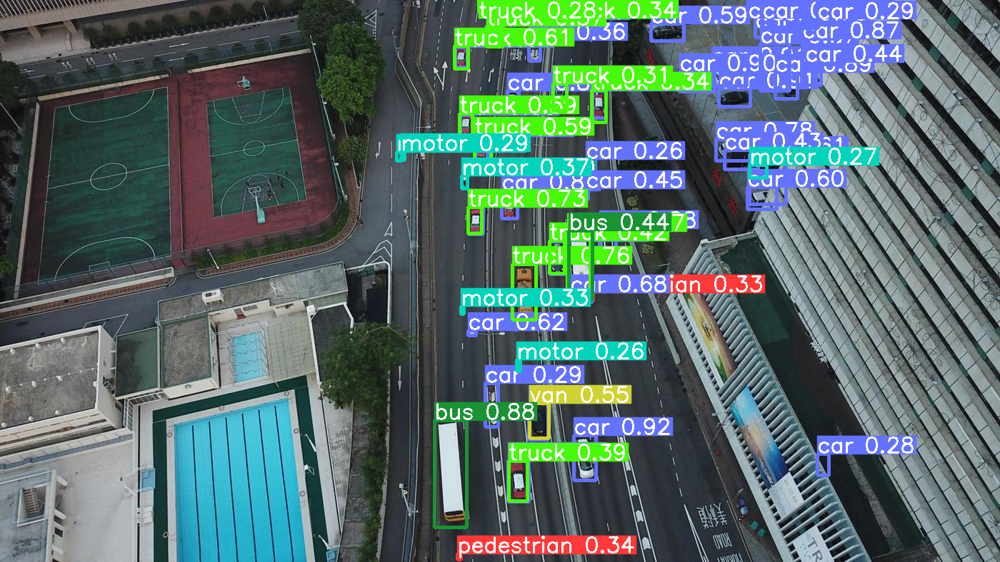

In [49]:
result.export_visuals(export_dir="demo_data/")

Image("demo_data/prediction_visual.png")

In [50]:
def create_df_mAP_sahi(image_files, model, class_names_dict):
    # boxes_gt = []
    # class_gt = []
    # img_id_gt = []

    boxes_pred = []
    class_pred = []
    img_id_pred = []
    scores_pred = []

    for i in range(len(image_files)):
        print('i = ', i)
        img_id = 'img_' + str(i)
        # prediction
        result = get_sliced_prediction(
          image_files[i],
          detection_model,
          slice_height = 256,
          slice_width = 256,
          overlap_height_ratio = 0.2,
          overlap_width_ratio = 0.2
        )
        result_lst = result.to_coco_annotations()
        # display(result_lst)
        if(len(result_lst) != 0):
          for j in range(len(result_lst)):
            result_lst_j = result_lst[j]
            boxes_pred.append(np.asarray(result_lst_j['bbox'], dtype="int"))
            class_pred.append(result_lst_j['category_name'])
            scores_pred.append(result_lst_j['score'])
            img_id_pred.append(img_id)


        # # ground truth
        # image_path = image_files[i]
        # annotation_path = image_path.replace('/images/', '/annotations/')
        # annotation_path = annotation_path.replace('.jpg', '.txt')
        # with open(annotation_path, 'r') as file:
        #     lines = file.readlines()
        #     for line in lines:
        #         elements = line.strip().split(',')
        #         x_min, y_min, width, height, class_label = int(elements[0]), int(elements[1]), int(elements[2]), int(elements[3]), int(elements[5]) - 1
        #         if (0 <= class_label <= 9 and width  > 0 and height > 0):
        #             boxes_gt.append([x_min, y_min, x_min + width, y_min + height])
        #             class_gt.append(class_names_dict.get(class_label))
        #             img_id_gt.append(img_id)

    pred_df = pd.DataFrame({'box_pred': boxes_pred, 'confidence': scores_pred, 'class': class_pred, 'img_id': img_id_pred})
    # gt_df = pd.DataFrame({'box_gt': boxes_gt, 'class': class_gt, 'img_id': img_id_gt})
    return pred_df

In [51]:
pred_df_sahi = create_df_mAP_sahi(image_files, model, class_names_dict)

i =  0
Performing prediction on 28 slices.
i =  1
Performing prediction on 28 slices.
i =  2
Performing prediction on 28 slices.
i =  3
Performing prediction on 28 slices.
i =  4
Performing prediction on 28 slices.
i =  5
Performing prediction on 28 slices.
i =  6
Performing prediction on 60 slices.
i =  7
Performing prediction on 60 slices.
i =  8
Performing prediction on 28 slices.
i =  9
Performing prediction on 35 slices.
i =  10
Performing prediction on 28 slices.
i =  11
Performing prediction on 35 slices.
i =  12
Performing prediction on 28 slices.
i =  13
Performing prediction on 35 slices.
i =  14
Performing prediction on 28 slices.
i =  15
Performing prediction on 28 slices.
i =  16
Performing prediction on 28 slices.
i =  17
Performing prediction on 28 slices.
i =  18
Performing prediction on 28 slices.
i =  19
Performing prediction on 28 slices.
i =  20
Performing prediction on 35 slices.
i =  21
Performing prediction on 60 slices.
i =  22
Performing prediction on 28 slices

In [52]:
pred_df_sahi

,box_pred,confidence,class,img_id
0,"[640, 776, 5, 8]",0.335589,pedestrian,img_0
1,"[820, 410, 10, 10]",0.326663,pedestrian,img_0
2,"[646, 246, 8, 17]",0.296375,people,img_0
3,"[803, 610, 31, 62]",0.917658,car,img_0
4,"[1006, 124, 44, 24]",0.909833,car,img_0
...,...,...,...,...
93830,"[1323, 119, 22, 29]",0.294559,truck,img_1609
93831,"[822, 134, 30, 19]",0.392276,motor,img_1609
93832,"[1175, 639, 20, 34]",0.359856,motor,img_1609
93833,"[262, 805, 17, 16]",0.348617,motor,img_1609


In [53]:
# Apply the function to the 'box_gt' column
pred_df_sahi['box_pred'] = pred_df_sahi['box_pred'].apply(convert_bbox_format)

In [54]:
pred_df_sahi

,box_pred,confidence,class,img_id
0,"[(640, 776), (5, 8)]",0.335589,pedestrian,img_0
1,"[(820, 410), (10, 10)]",0.326663,pedestrian,img_0
2,"[(646, 246), (8, 17)]",0.296375,people,img_0
3,"[(803, 610), (31, 62)]",0.917658,car,img_0
4,"[(1006, 124), (44, 24)]",0.909833,car,img_0
...,...,...,...,...
93830,"[(1323, 119), (22, 29)]",0.294559,truck,img_1609
93831,"[(822, 134), (30, 19)]",0.392276,motor,img_1609
93832,"[(1175, 639), (20, 34)]",0.359856,motor,img_1609
93833,"[(262, 805), (17, 16)]",0.348617,motor,img_1609


In [55]:
pred_df_sahi['class'].unique()

array(['pedestrian', 'people', 'car', 'van', 'truck', 'bus', 'motor', 'bicycle', 'tricycle', 'awning-tricycle'], dtype=object)

In [56]:
def transform_box_pred(df, col):
  res = []
  for i in range(len(df[col])):
    new_val = [(df.iloc[i][col][0]), (df.iloc[i][col][0][0] + df.iloc[i][col][1][0], df.iloc[i][col][0][1] + df.iloc[i][col][1][1])]
    res.append(new_val)
  df[col] = res
  return df

In [57]:
pred_df_sahi_transform = transform_box_pred(pred_df_sahi, 'box_pred')

In [58]:
pred_df_sahi_transform

,box_pred,confidence,class,img_id
0,"[(640, 776), (645, 784)]",0.335589,pedestrian,img_0
1,"[(820, 410), (830, 420)]",0.326663,pedestrian,img_0
2,"[(646, 246), (654, 263)]",0.296375,people,img_0
3,"[(803, 610), (834, 672)]",0.917658,car,img_0
4,"[(1006, 124), (1050, 148)]",0.909833,car,img_0
...,...,...,...,...
93830,"[(1323, 119), (1345, 148)]",0.294559,truck,img_1609
93831,"[(822, 134), (852, 153)]",0.392276,motor,img_1609
93832,"[(1175, 639), (1195, 673)]",0.359856,motor,img_1609
93833,"[(262, 805), (279, 821)]",0.348617,motor,img_1609


In [59]:
AP_lst = []
for x in classes:
    AP_x = AP_per_class(gt_df, pred_df_sahi_transform, x)
    AP_lst.append(AP_x)

In [60]:
AP_lst

[0.200090993830766,
 0.09031726860997531,
 0.035473837251533726,
 0.5993956642790587,
 0.16197133677083797,
 0.10995789067651768,
 0.038110726648296823,
 0.0162,
 0.3509818885517453,
 0.12630660447794004]

In [61]:
mAP = np.mean(AP_lst)
mAP

0.17288062110966712

In [62]:
for i in range(len(classes)):
    print('Class: {} with AP = {}'.format(classes[i], AP_lst[i]))

Class: pedestrian with AP = 0.200090993830766
Class: people with AP = 0.09031726860997531
Class: bicycle with AP = 0.035473837251533726
Class: car with AP = 0.5993956642790587
Class: van with AP = 0.16197133677083797
Class: truck with AP = 0.10995789067651768
Class: tricycle with AP = 0.038110726648296823
Class: awning-tricycle with AP = 0.0162
Class: bus with AP = 0.3509818885517453
Class: motor with AP = 0.12630660447794004


In [63]:
from copy import deepcopy

In [92]:
pred_df_sahi_transform_nms = deepcopy(pred_df_sahi_transform)

In [93]:
# Convert 'box_pred' to actual tuples
pred_df_sahi_transform_nms['box_pred'] = pred_df_sahi_transform_nms['box_pred'].apply(lambda x: [tuple(item) for item in x])

In [94]:
# Define IoU function
def calculate_iou(box1, box2):
    """ Calculate Intersection over Union (IoU) of two bounding boxes """
    (x1_tl, y1_tl), (w1, h1) = box1
    (x2_tl, y2_tl), (w2, h2) = box2

    x1_br, y1_br = x1_tl + w1, y1_tl + h1
    x2_br, y2_br = x2_tl + w2, y2_tl + h2

    # Calculate intersection coordinates
    x_tl = max(x1_tl, x2_tl)
    y_tl = max(y1_tl, y2_tl)
    x_br = min(x1_br, x2_br)
    y_br = min(y1_br, y2_br)

    if x_br <= x_tl or y_br <= y_tl:
        return 0.0

    # Calculate area of intersection rectangle
    intersection_area = (x_br - x_tl) * (y_br - y_tl)

    # Calculate area of both bounding boxes
    area_box1 = w1 * h1
    area_box2 = w2 * h2

    # Calculate IoU
    iou = intersection_area / float(area_box1 + area_box2 - intersection_area)
    return iou

# Implement Non-Maximum Suppression (NMS)
def apply_nms(detections, threshold=0.95):
    """ Apply Non-Maximum Suppression on detections """
    if len(detections) == 0:
        return []

    # Sort detections based on confidence score
    detections.sort(key=lambda x: x[1], reverse=True)
    keep = []

    while len(detections) > 0:
        max_detection = detections.pop(0)
        keep.append(max_detection)

        # Remove detections with IoU greater than threshold
        detections = [d for d in detections if calculate_iou(max_detection[0], d[0]) < threshold]

    return keep

In [95]:
# Apply NMS to each image and each class separately
grouped = pred_df_sahi_transform_nms.groupby(['img_id', 'class'])
final_detections = []

for (img_id, class_name), group in grouped:
    detections = [(box_pred, confidence) for box_pred, confidence in zip(group['box_pred'], group['confidence'])]
    detections = apply_nms(detections)
    final_detections.extend([(box_pred, confidence, class_name, img_id) for box_pred, confidence in detections])

# Convert final detections to dataframe
columns = ['box_pred', 'confidence', 'class', 'img_id']
final_df = pd.DataFrame(final_detections, columns=columns)

In [96]:
final_df

,box_pred,confidence,class,img_id
0,"[(608, 589), (652, 738)]",0.876531,bus,img_0
1,"[(796, 323), (829, 420)]",0.435862,bus,img_0
2,"[(803, 610), (834, 672)]",0.917658,car,img_0
3,"[(1006, 124), (1050, 148)]",0.909833,car,img_0
4,"[(996, 90), (1044, 120)]",0.907604,car,img_0
...,...,...,...,...
91743,"[(1463, 163), (1485, 207)]",0.322235,truck,img_999
91744,"[(1583, 837), (1723, 939)]",0.301284,truck,img_999
91745,"[(1451, 212), (1484, 255)]",0.272596,truck,img_999
91746,"[(1192, 662), (1285, 724)]",0.505145,van,img_999


In [97]:
print(final_df['class'].nunique())
print(final_df['img_id'].nunique())

10
1610


In [98]:
AP_lst = []
for x in classes:
    AP_x = AP_per_class(gt_df, final_df, x)
    AP_lst.append(AP_x)

In [99]:
AP_lst

[0.19545729138226367,
 0.09033148196157928,
 0.03562444007012441,
 0.5990624671484023,
 0.16251682412669485,
 0.10996013946728377,
 0.038110726648296823,
 0.0162,
 0.3515023637041176,
 0.12634819563597413]

In [100]:
mAP = np.mean(AP_lst)
mAP

0.1725113930144737

In [101]:
for i in range(len(classes)):
    print('Class: {} with AP = {}'.format(classes[i], AP_lst[i]))

Class: pedestrian with AP = 0.19545729138226367
Class: people with AP = 0.09033148196157928
Class: bicycle with AP = 0.03562444007012441
Class: car with AP = 0.5990624671484023
Class: van with AP = 0.16251682412669485
Class: truck with AP = 0.10996013946728377
Class: tricycle with AP = 0.038110726648296823
Class: awning-tricycle with AP = 0.0162
Class: bus with AP = 0.3515023637041176
Class: motor with AP = 0.12634819563597413


In [74]:
gt_df.to_csv(r'/content/gdrive/MyDrive/Master Computer Science/Programming for Advanced AI/gt_df.csv', index=False)

In [75]:
pred_df.to_csv(r'/content/gdrive/MyDrive/Master Computer Science/Programming for Advanced AI/pred_df.csv', index=False)

In [76]:
pred_df_sahi_transform.to_csv(r'/content/gdrive/MyDrive/Master Computer Science/Programming for Advanced AI/pred_df_sahi_transform.csv', index=False)